# SNEMI3D Dataset - Exploratory Data Analysis

This notebook provides visualization and analysis of the SNEMI3D dataset for neuron segmentation.

**Dataset Info:**
- Source: Kasthuri et al. (2015) Cell
- Resolution: 6×6×30 nm (anisotropic)
- Volume size: 1024×1024×100 per stack
- Labels: background, neuron instances

In [1]:
import sys
sys.path.insert(0, '..')

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors
import h5py
import tifffile
from pathlib import Path

# Set up plotting
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['figure.dpi'] = 100

# Dataset path - UPDATE THIS
DATA_ROOT = Path('../data/SNEMI3D')

## 1. Load Dataset Information

In [2]:
from neurocircuitry.datasets import SNEMI3DDataset

# Print dataset metadata
print("=" * 60)
print("SNEMI3D Dataset Metadata")
print("=" * 60)
print(f"\nPaper: {SNEMI3DDataset._paper}")
print(f"\nResolution: {SNEMI3DDataset._resolution}")
print(f"Labels: {SNEMI3DDataset._labels}")

SNEMI3D Dataset Metadata

Paper: Kasthuri, N., et al. (2015). Saturated Reconstruction of a Volume of Neocortex. Cell, 162(3), 648-661. doi:10.1016/j.cell.2015.06.054

Resolution: {'x': 6.0, 'y': 6.0, 'z': 30.0}
Labels: ['background', 'neuron']


## 2. Load Raw Data Files

In [3]:
def load_snemi3d_data(data_root):
    """
    Load SNEMI3D volumes and labels.
    Supports both HDF5 and TIFF formats.
    """
    data_root = Path(data_root)
    
    volumes = {}
    
    # Try to load AC4 (training) data
    for name, base in [('AC4_train', 'AC4_inputs'), ('AC4_labels', 'AC4_labels'),
                       ('AC3_test', 'AC3_inputs'), ('AC3_labels', 'AC3_labels')]:
        # for ext in ['.h5', '.hdf5', '.tiff', '.tif']:
        for ext in ['.h5']:
            path = data_root / f"{base}{ext}"
            if path.exists():
                print(f"Found: {path}")
                if ext in ['.h5', '.hdf5']:
                    with h5py.File(path, 'r') as f:
                        key = list(f.keys())[0]
                        volumes[name] = f[key][:]
                else:
                    volumes[name] = tifffile.imread(str(path))
                break
    
    return volumes

# Load data
if DATA_ROOT.exists():
    volumes = load_snemi3d_data(DATA_ROOT)
    print(f"\nLoaded {len(volumes)} volumes")
    for name, vol in volumes.items():
        print(f"  {name}: shape={vol.shape}, dtype={vol.dtype}")
else:
    print(f"Data root not found: {DATA_ROOT}")
    print("Please update DATA_ROOT to point to your SNEMI3D data directory")
    volumes = {}

Found: ../data/SNEMI3D/AC4_inputs.h5
Found: ../data/SNEMI3D/AC4_labels.h5
Found: ../data/SNEMI3D/AC3_inputs.h5
Found: ../data/SNEMI3D/AC3_labels.h5

Loaded 4 volumes
  AC4_train: shape=(100, 1024, 1024), dtype=uint8
  AC4_labels: shape=(100, 1024, 1024), dtype=uint16
  AC3_test: shape=(100, 1024, 1024), dtype=uint8
  AC3_labels: shape=(100, 1024, 1024), dtype=uint16


## 3. Volume Statistics

In [4]:
def print_volume_stats(volumes):
    """Print statistics for each volume."""
    print("\n" + "=" * 60)
    print("Volume Statistics")
    print("=" * 60)
    
    for name, vol in volumes.items():
        print(f"\n{name}:")
        print(f"  Shape: {vol.shape}")
        print(f"  Dtype: {vol.dtype}")
        print(f"  Min: {vol.min()}, Max: {vol.max()}")
        print(f"  Mean: {vol.mean():.2f}, Std: {vol.std():.2f}")
        print(f"  Memory: {vol.nbytes / 1024**2:.2f} MB")
        
        if 'label' in name.lower():
            unique_labels = np.unique(vol)
            print(f"  Unique labels: {len(unique_labels)}")
            if len(unique_labels) <= 20:
                print(f"  Label values: {unique_labels}")

if volumes:
    print_volume_stats(volumes)


Volume Statistics

AC4_train:
  Shape: (100, 1024, 1024)
  Dtype: uint8
  Min: 0, Max: 255
  Mean: 129.07, Std: 48.57
  Memory: 100.00 MB

AC4_labels:
  Shape: (100, 1024, 1024)
  Dtype: uint16
  Min: 0, Max: 400
  Mean: 87.68, Std: 106.25
  Memory: 200.00 MB
  Unique labels: 401

AC3_test:
  Shape: (100, 1024, 1024)
  Dtype: uint8
  Min: 0, Max: 255
  Mean: 151.90, Std: 49.08
  Memory: 100.00 MB

AC3_labels:
  Shape: (100, 1024, 1024)
  Dtype: uint16
  Min: 0, Max: 598
  Mean: 128.04, Std: 157.89
  Memory: 200.00 MB
  Unique labels: 334


## 4. Visualize Multiple Slices

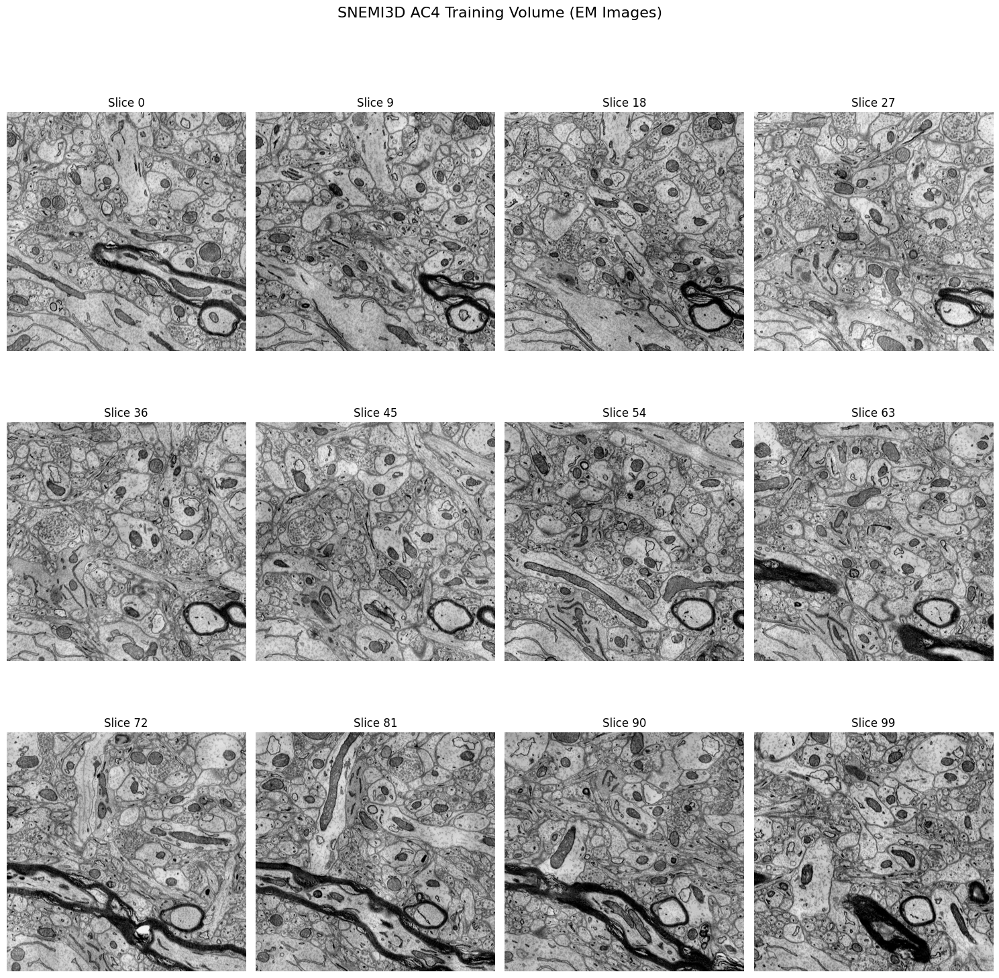

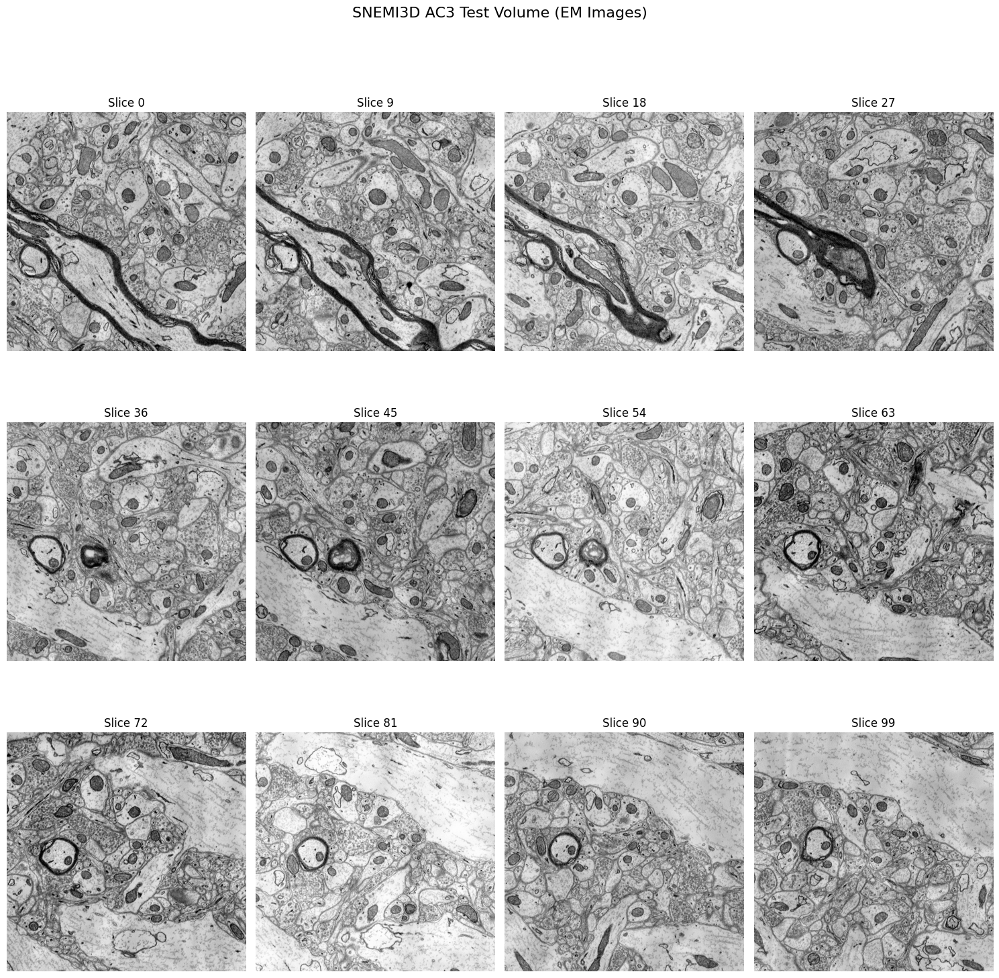

In [5]:
def visualize_slices(volume, title, num_slices=12, cmap='gray'):
    """
    Visualize multiple slices from a 3D volume.
    """
    n_total = volume.shape[0]
    indices = np.linspace(0, n_total - 1, num_slices, dtype=int)
    
    cols = 4
    rows = (num_slices + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(12, 4 * rows))
    axes = axes.flatten()
    
    for i, idx in enumerate(indices):
        ax = axes[i]
        im = ax.imshow(volume[idx], cmap=cmap)
        ax.set_title(f'Slice {idx}')
        ax.axis('off')
        # plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    
    # Hide unused axes
    for i in range(num_slices, len(axes)):
        axes[i].axis('off')
    
    plt.suptitle(title, fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

# Visualize training volume
if 'AC4_train' in volumes:
    visualize_slices(volumes['AC4_train'], 'SNEMI3D AC4 Training Volume (EM Images)')

if 'AC3_test' in volumes:
    visualize_slices(volumes['AC3_test'], 'SNEMI3D AC3 Test Volume (EM Images)')

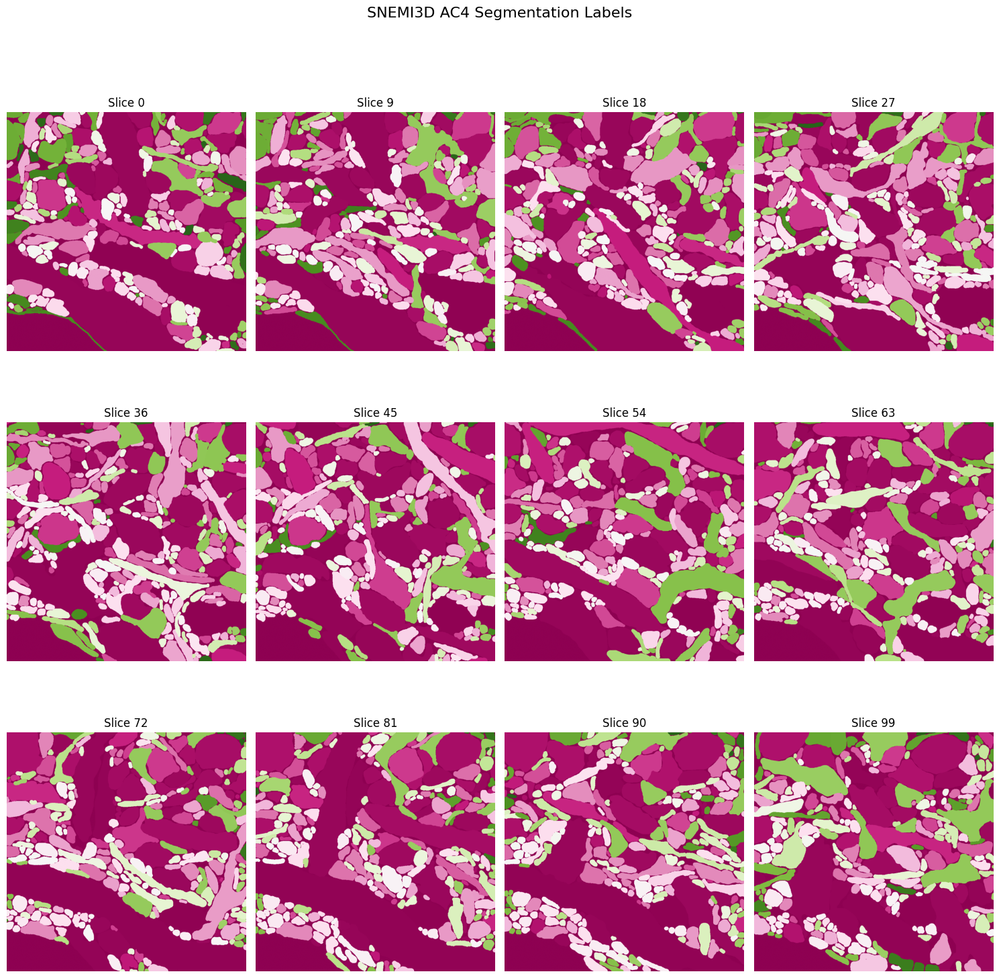

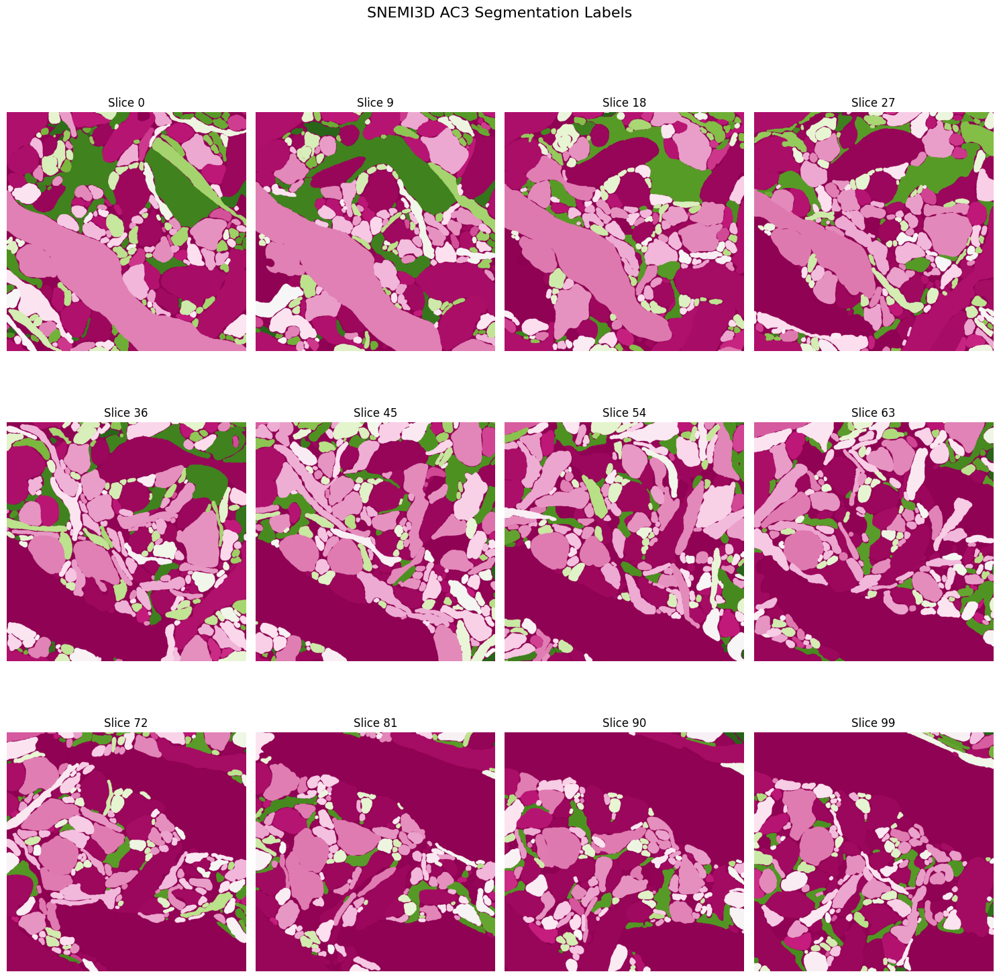

In [6]:
def visualize_segmentation(labels, title, num_slices=12):
    """
    Visualize segmentation labels with PiYG colormap.
    """
    n_total = labels.shape[0]
    indices = np.linspace(0, n_total - 1, num_slices, dtype=int)
    
    # Use PiYG colormap for segmentation
    cmap = 'PiYG'
    
    cols = 4
    rows = (num_slices + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(12, 4 * rows))
    axes = axes.flatten()
    
    for i, idx in enumerate(indices):
        ax = axes[i]
        ax.imshow(labels[idx], cmap=cmap)
        ax.set_title(f'Slice {idx}')
        ax.axis('off')
    
    for i in range(num_slices, len(axes)):
        axes[i].axis('off')
    
    plt.suptitle(title, fontsize=16, y=1.02)
    plt.tight_layout()
    plt.show()

# Visualize segmentation
if 'AC4_labels' in volumes:
    visualize_segmentation(volumes['AC4_labels'], 'SNEMI3D AC4 Segmentation Labels')
if 'AC3_labels' in volumes:
    visualize_segmentation(volumes['AC3_labels'], 'SNEMI3D AC3 Segmentation Labels')

## 5. Side-by-Side Comparison

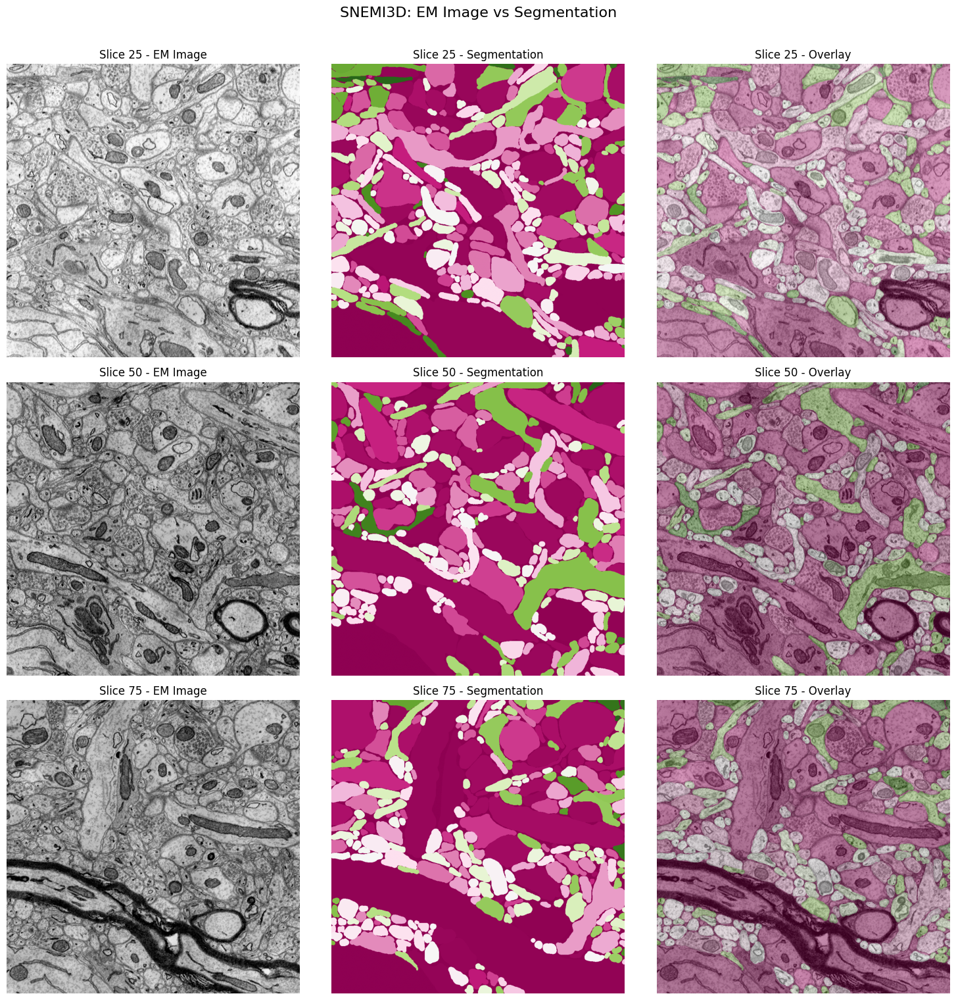

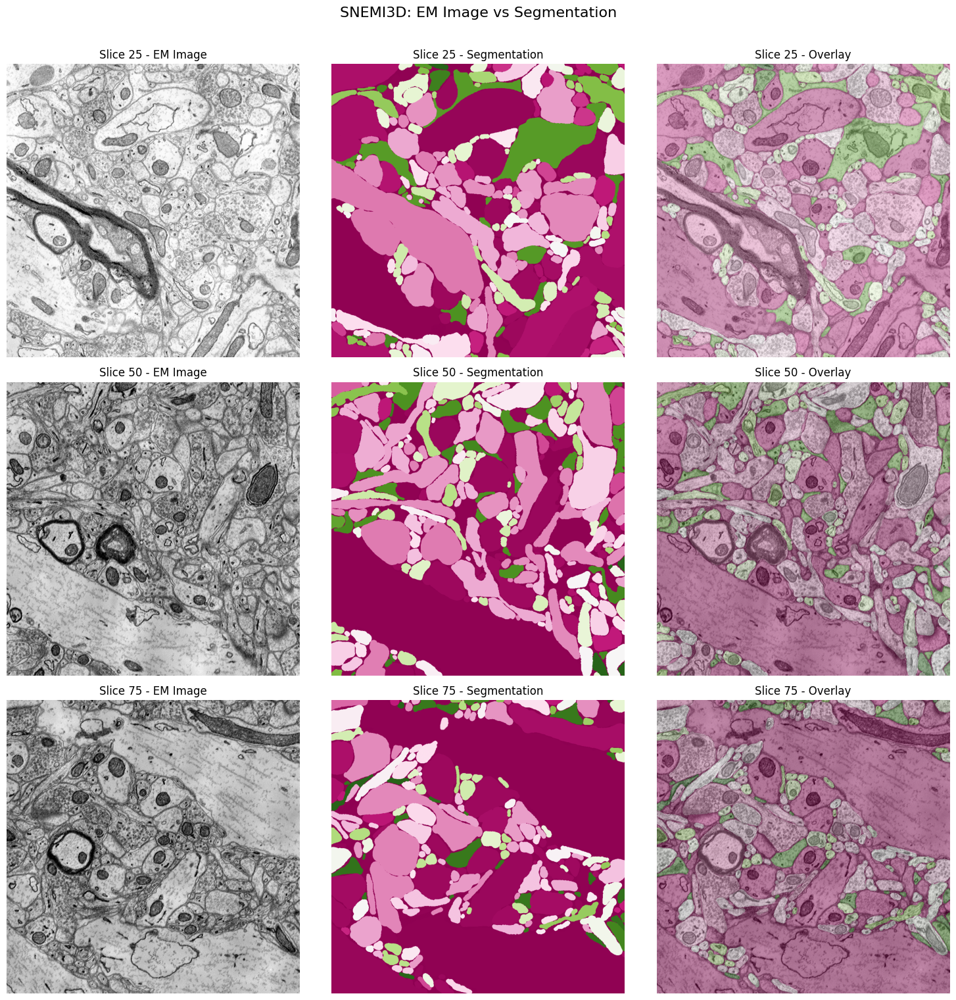

In [7]:
def visualize_comparison(volume, labels, slice_indices=None):
    """
    Show volume and segmentation side by side.
    """
    if slice_indices is None:
        slice_indices = [volume.shape[0] // 4, volume.shape[0] // 2, 3 * volume.shape[0] // 4]
    
    # Create colormap
    n_labels = int(labels.max()) + 1
    np.random.seed(42)
    random_colors = np.random.rand(n_labels, 3)
    random_colors[0] = [0, 0, 0]
    # cmap = colors.ListedColormap(random_colors)
    cmap = 'PiYG'
    
    fig, axes = plt.subplots(len(slice_indices), 3, figsize=(12, 4 * len(slice_indices)))
    
    for i, idx in enumerate(slice_indices):
        # Raw image
        axes[i, 0].imshow(volume[idx], cmap='gray')
        axes[i, 0].set_title(f'Slice {idx} - EM Image')
        axes[i, 0].axis('off')
        
        # Segmentation
        axes[i, 1].imshow(labels[idx], cmap=cmap)
        axes[i, 1].set_title(f'Slice {idx} - Segmentation')
        axes[i, 1].axis('off')
        
        # Overlay
        axes[i, 2].imshow(volume[idx], cmap='gray')
        axes[i, 2].imshow(labels[idx], cmap=cmap, alpha=0.4)
        axes[i, 2].set_title(f'Slice {idx} - Overlay')
        axes[i, 2].axis('off')
    
    plt.suptitle('SNEMI3D: EM Image vs Segmentation', fontsize=16, y=1.01)
    plt.tight_layout()
    plt.show()

if 'AC4_train' in volumes and 'AC4_labels' in volumes:
    visualize_comparison(volumes['AC4_train'], volumes['AC4_labels'])
if 'AC3_test' in volumes and 'AC3_labels' in volumes:
    visualize_comparison(volumes['AC3_test'], volumes['AC3_labels'])

## 6. Label Distribution Analysis

In [8]:
def analyze_labels(labels):
    """
    Analyze label distribution and instance sizes.
    """
    unique_labels, counts = np.unique(labels, return_counts=True)
    
    print("\n" + "=" * 60)
    print("Label Analysis")
    print("=" * 60)
    print(f"\nTotal unique labels (including background): {len(unique_labels)}")
    print(f"Number of instances (excluding background): {len(unique_labels) - 1}")
    
    # Background vs foreground
    bg_pixels = counts[0] if unique_labels[0] == 0 else 0
    fg_pixels = labels.size - bg_pixels
    print(f"\nBackground pixels: {bg_pixels:,} ({100*bg_pixels/labels.size:.1f}%)")
    print(f"Foreground pixels: {fg_pixels:,} ({100*fg_pixels/labels.size:.1f}%)")
    
    # Instance size statistics (excluding background)
    instance_sizes = counts[unique_labels > 0]
    if len(instance_sizes) > 0:
        print(f"\nInstance Size Statistics:")
        print(f"  Min: {instance_sizes.min():,} voxels")
        print(f"  Max: {instance_sizes.max():,} voxels")
        print(f"  Mean: {instance_sizes.mean():,.0f} voxels")
        print(f"  Median: {np.median(instance_sizes):,.0f} voxels")
        print(f"  Std: {instance_sizes.std():,.0f} voxels")
    
    return unique_labels, counts

if 'AC4_labels' in volumes:
    unique_labels, counts = analyze_labels(volumes['AC4_labels'])


Label Analysis

Total unique labels (including background): 401
Number of instances (excluding background): 400

Background pixels: 10,713,442 (10.2%)
Foreground pixels: 94,144,158 (89.8%)

Instance Size Statistics:
  Min: 2,180 voxels
  Max: 4,919,028 voxels
  Mean: 235,360 voxels
  Median: 89,350 voxels
  Std: 539,765 voxels


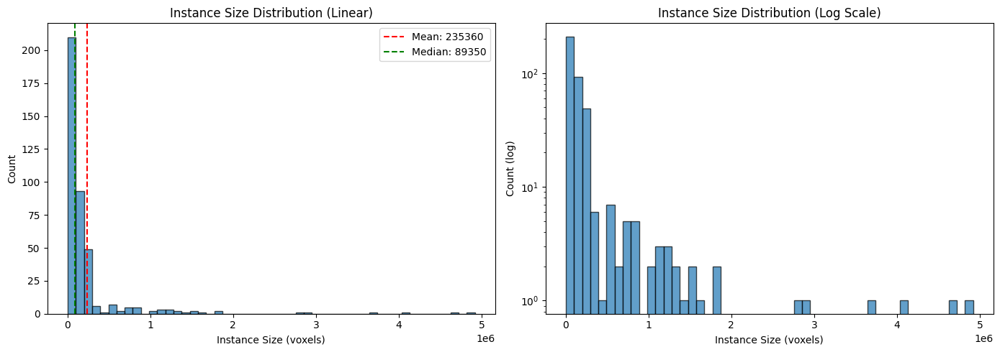

In [9]:
def plot_instance_size_distribution(labels):
    """
    Plot histogram of instance sizes.
    """
    unique_labels, counts = np.unique(labels, return_counts=True)
    
    # Exclude background
    instance_sizes = counts[unique_labels > 0]
    
    if len(instance_sizes) == 0:
        print("No instances found")
        return
    
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    
    # Linear scale
    axes[0].hist(instance_sizes, bins=50, edgecolor='black', alpha=0.7)
    axes[0].set_xlabel('Instance Size (voxels)')
    axes[0].set_ylabel('Count')
    axes[0].set_title('Instance Size Distribution (Linear)')
    axes[0].axvline(np.mean(instance_sizes), color='r', linestyle='--', label=f'Mean: {np.mean(instance_sizes):.0f}')
    axes[0].axvline(np.median(instance_sizes), color='g', linestyle='--', label=f'Median: {np.median(instance_sizes):.0f}')
    axes[0].legend()
    
    # Log scale
    axes[1].hist(instance_sizes, bins=50, edgecolor='black', alpha=0.7)
    axes[1].set_xlabel('Instance Size (voxels)')
    axes[1].set_ylabel('Count (log)')
    axes[1].set_yscale('log')
    axes[1].set_title('Instance Size Distribution (Log Scale)')
    
    plt.tight_layout()
    plt.show()

if 'AC4_labels' in volumes:
    plot_instance_size_distribution(volumes['AC4_labels'])

## 7. Per-Slice Analysis

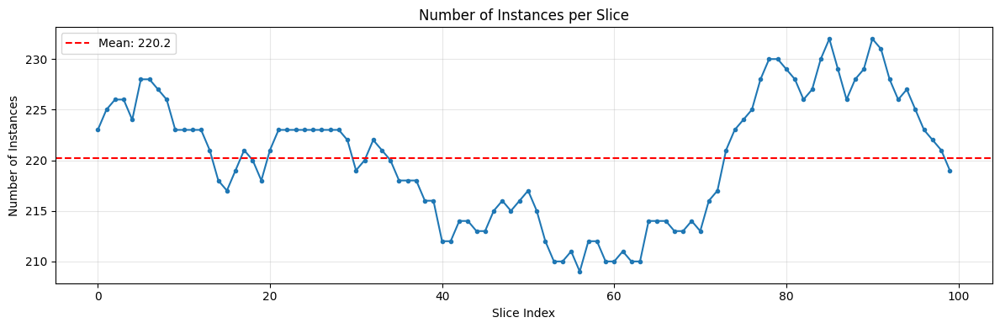


Per-slice statistics:
  Min instances: 209
  Max instances: 232
  Mean instances: 220.2


In [10]:
def analyze_per_slice(labels):
    """
    Analyze number of instances per slice.
    """
    n_slices = labels.shape[0]
    instances_per_slice = []
    
    for i in range(n_slices):
        unique = np.unique(labels[i])
        n_instances = len(unique[unique > 0])  # Exclude background
        instances_per_slice.append(n_instances)
    
    instances_per_slice = np.array(instances_per_slice)
    
    fig, ax = plt.subplots(figsize=(12, 4))
    ax.plot(instances_per_slice, marker='o', markersize=3)
    ax.set_xlabel('Slice Index')
    ax.set_ylabel('Number of Instances')
    ax.set_title('Number of Instances per Slice')
    ax.axhline(instances_per_slice.mean(), color='r', linestyle='--', 
               label=f'Mean: {instances_per_slice.mean():.1f}')
    ax.legend()
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    print(f"\nPer-slice statistics:")
    print(f"  Min instances: {instances_per_slice.min()}")
    print(f"  Max instances: {instances_per_slice.max()}")
    print(f"  Mean instances: {instances_per_slice.mean():.1f}")

if 'AC4_labels' in volumes:
    analyze_per_slice(volumes['AC4_labels'])

## 8. Using NeuroCircuitry Dataset Class

In [11]:
# Example of using the NeuroCircuitry dataset class
# (Only works if data is available)

if DATA_ROOT.exists():
    try:
        from neurocircuitry.datasets import SNEMI3DDataset
        
        dataset = SNEMI3DDataset(
            root_dir=str(DATA_ROOT),
            split='train',
            train_val_split=0.2,
            cache_rate=0.0,  # Don't cache for EDA
        )
        
        print(f"\nDataset loaded successfully!")
        print(dataset)
        
        # Get a sample
        sample = dataset[0]
        print(f"\nSample keys: {sample.keys()}")
        print(f"Image shape: {sample['image'].shape}")
        if 'label' in sample:
            print(f"Label shape: {sample['label'].shape}")
            
    except Exception as e:
        print(f"Could not load dataset: {e}")
else:
    print("Update DATA_ROOT to test the NeuroCircuitry dataset class")


Dataset loaded successfully!
SNEMI3DDataset(
  root_dir=../data/SNEMI3D,
  split='train',
  paper='Kasthuri, N., et al. (2015). Saturated Reconstruction of a Volume of Neocortex. Cell, 162(3), 648-661. doi:10.1016/j.cell.2015.06.054',
  resolution={'x': 6.0, 'y': 6.0, 'z': 30.0},
  labels=['background', 'neuron'],
  num_samples=80
)

Sample keys: dict_keys(['image', 'slice_idx', 'volume', 'idx', 'label'])
Image shape: (1024, 1024)
Label shape: (1024, 1024)
